In [1]:
import os
import numpy as np
import scanpy as sc
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import rpy2
import pickle
import cellrank as cr
from cellrank.tl.kernels import PalantirKernel
from cellrank.tl.estimators import GPCCA
#import anndata2ri
plt.rcParams['figure.figsize']=(5, 5)
sc.settings.verbosity = 3
sc.logging.print_header()

%load_ext autoreload
%autoreload 2 

scanpy==1.7.1 anndata==0.7.4 umap==0.5.1 numpy==1.20.1 scipy==1.6.1 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.9.0 louvain==0.7.0 leidenalg==0.8.3


In [2]:
import cellrank

In [3]:
adata = sc.read('./../../data/processed/adata_reannotated_final.h5ad')

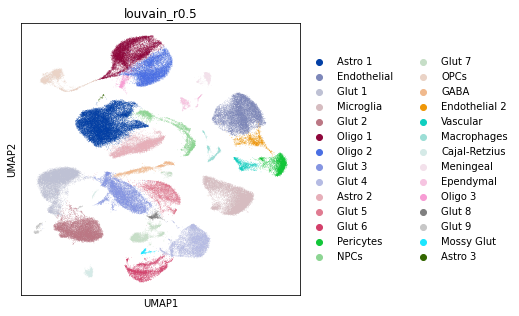

In [4]:
sc.pl.umap(adata, color='louvain_r0.5')

# Oligo WT

In [5]:
adata.obs['louvain_cr'] = adata.obs['louvain_r0.5'].copy()
adata.obs['louvain_cr'] = adata.obs['louvain_cr'].cat.rename_categories(
    {
        'Oligo 1': 'Oligodendrocytes (Ctrl)',
        'Oligo 2': 'Oligodendrocytes (Stress)'
    })

In [6]:
adata_oligo_wt = adata[(adata.obs['louvain_r0.5'].isin(['Oligo 1', 'Oligo 2', 'OPCs'])) &
                       (adata.obs['line']=='Ctrl')].copy()

In [7]:
adata_oligo_wt.obs['louvain_coarse'].value_counts()

Oligodendrocytes    6034
OPCs                 636
MFOLs                213
COPs                 128
Name: louvain_coarse, dtype: int64

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9992212  0.983494   0.9803344  0.9688252  0.9610206
     0.95242107 0.9345175  0.92757314 0.92559326 0.9200486  0.9105874
     0.8983553  0.88761234 0.8813274 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)
computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


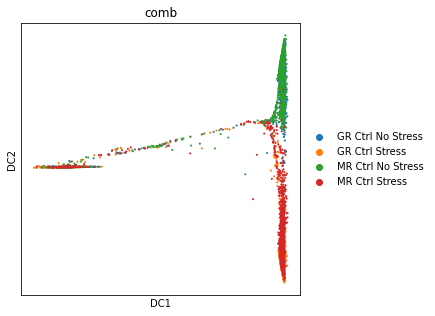

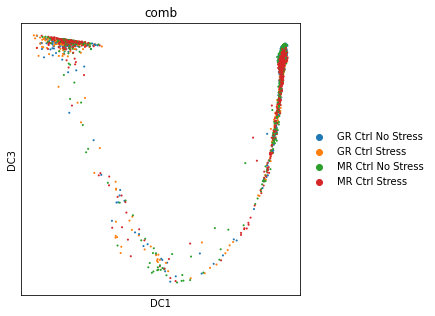

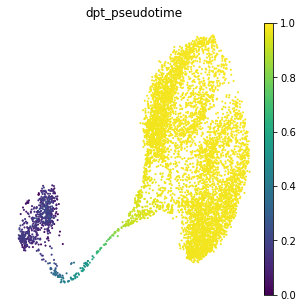

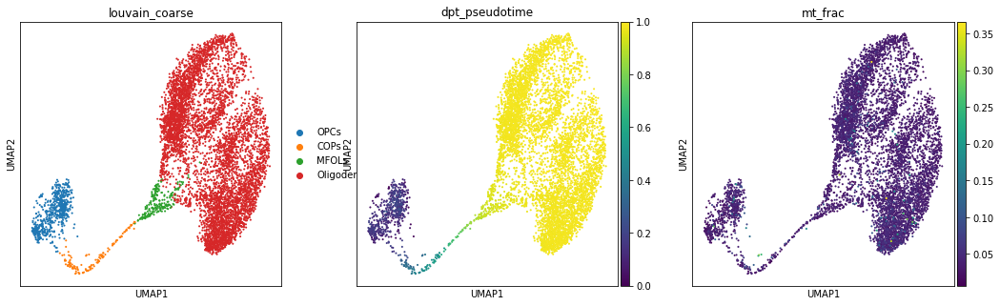

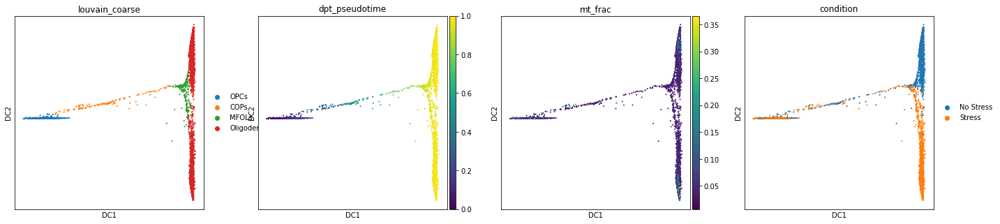

In [8]:
#sc.pp.pca(adata_oligo_wt)
sc.pp.neighbors(adata_oligo_wt, n_neighbors=50)
sc.tl.diffmap(adata_oligo_wt)
opc_mask = np.isin(adata_oligo_wt.obs['louvain_coarse'], 'OPCs')
max_opc_id = np.argmax(adata_oligo_wt.obsm['X_diffmap'][opc_mask,3])
root_id = np.arange(len(opc_mask))[opc_mask][max_opc_id]
adata_oligo_wt.uns['iroot'] = root_id
sc.tl.dpt(adata_oligo_wt)
sc.pl.diffmap(adata_oligo_wt, color=['comb'], components='1, 2')
sc.pl.diffmap(adata_oligo_wt, color=['comb'], components='1, 3')
sc.pl.umap(adata_oligo_wt, color='dpt_pseudotime', frameon=False)
sc.pl.umap(adata_oligo_wt, color=['louvain_coarse', 'dpt_pseudotime', 'mt_frac'])
sc.pl.diffmap(adata_oligo_wt, color=['louvain_coarse', 'dpt_pseudotime', 'mt_frac', 'condition'], components='1, 2')

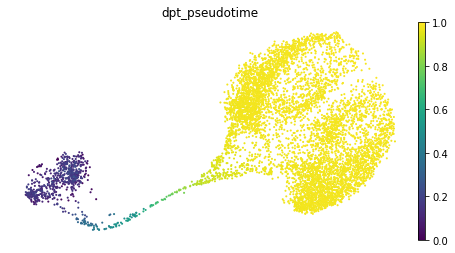

In [9]:
plt.rcParams['figure.figsize'] = (8, 4)
sc.pl.umap(
    adata_oligo_wt, 
    color='dpt_pseudotime', 
    frameon=False
)

In [10]:
adata_oligo_wt

AnnData object with n_obs × n_vars = 7011 × 17390
    obs: 'knockout', 'line', 'mouse', 'condition', 'sample', 'batch', 'comb', 'n_counts', 'log_counts', 'n_genes', 'hbb_frac', 'ribo_frac', 'mt_frac', 'doublet_score', 'size_factors', 'log_genes', 'louvain_ref', 'louvain_r1', 'louvain_r0.5', 'S_score', 'G2M_score', 'phase', 'louvain_coarse', 'louvain_tmp', 'louvain_cr', 'dpt_pseudotime'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'condition_colors', 'dendrogram_louvain_coarse', 'draw_graph', 'hvg', 'louvain', 'louvain_r0.5_colors', 'louvain_r1_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_louvain_coarse', 'rank_genes_louvain_r0.5', 'sample_colors', 'umap', 'diffmap_evals', 'iroot', 'comb_colors', 'louvain_coarse_colors'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_tsne', 'X_umap', 'X_diffmap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

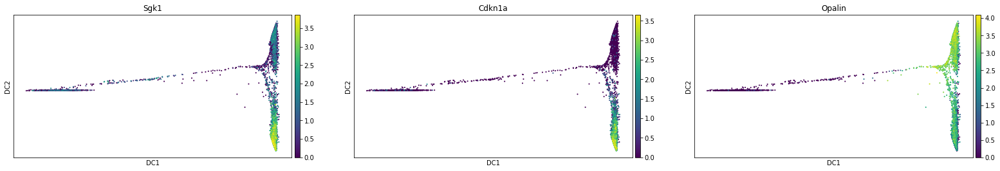

In [11]:
sc.pl.diffmap(adata_oligo_wt, color=['Sgk1', 'Cdkn1a', 'Opalin'], components='1, 2')

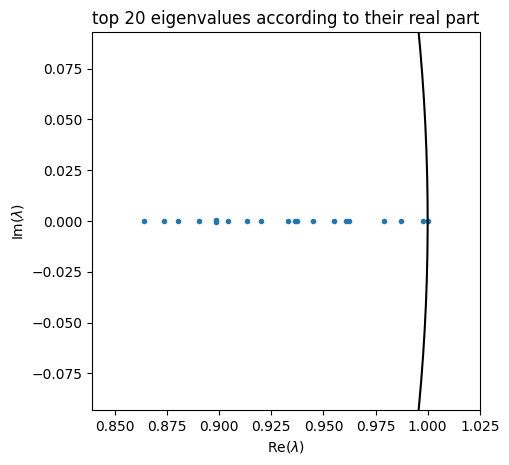

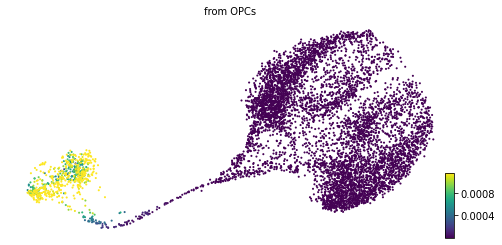

In [12]:
pk = PalantirKernel(adata_oligo_wt, time_key='dpt_pseudotime', backward=True).compute_transition_matrix()
g = GPCCA(pk)
g.compute_schur(n_components=20)
g.plot_spectrum()
g.compute_macrostates(n_states=1, cluster_key='louvain_cr')
g.plot_macrostates()
#g.set_main_states()

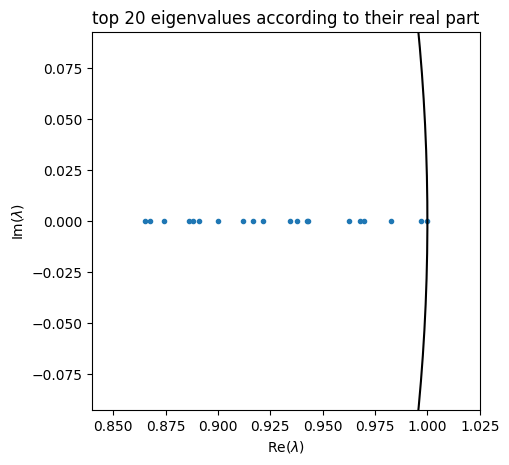

In [13]:
pk = PalantirKernel(adata_oligo_wt, time_key='dpt_pseudotime', backward=False).compute_transition_matrix()
g = GPCCA(pk)
g.compute_schur(n_components=20)
g.plot_spectrum()

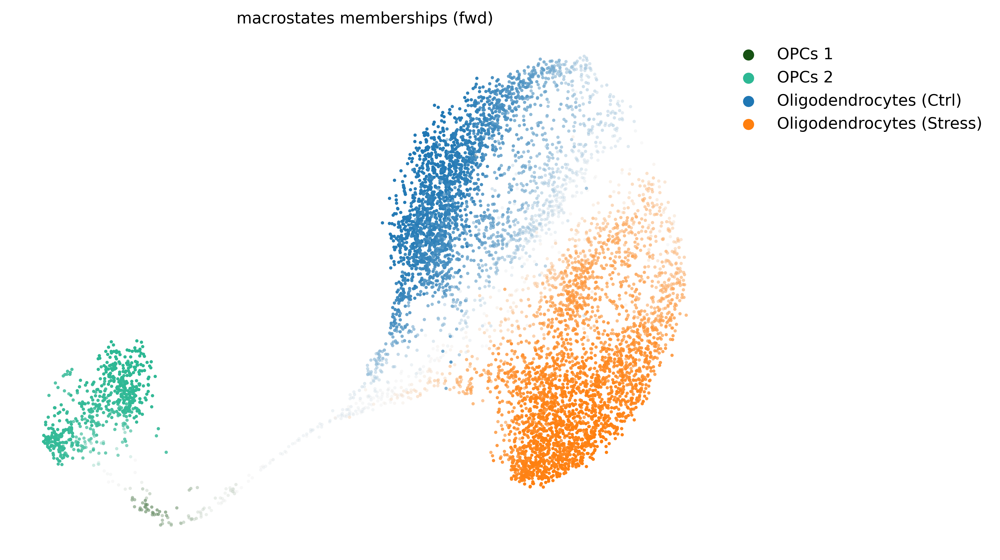

In [14]:
plt.rcParams['figure.dpi'] = 500
plt.rcParams['figure.figsize'] = (8, 6)
g.compute_macrostates(n_states=4, cluster_key='louvain_cr')
g.plot_macrostates()
g.set_terminal_states_from_macrostates(names=['Oligodendrocytes (Ctrl)', 'Oligodendrocytes (Stress)'])

In [15]:
g.compute_absorption_probabilities()

In [16]:
g.compute_lineage_drivers(lineages=['Oligodendrocytes (Ctrl)', 'Oligodendrocytes (Stress)'], return_drivers=False)

In [17]:
g.lineage_drivers

,Oligodendrocytes (Ctrl) corr,Oligodendrocytes (Ctrl) pval,Oligodendrocytes (Ctrl) qval,Oligodendrocytes (Ctrl) ci low,Oligodendrocytes (Ctrl) ci high,Oligodendrocytes (Stress) corr,Oligodendrocytes (Stress) pval,Oligodendrocytes (Stress) qval,Oligodendrocytes (Stress) ci low,Oligodendrocytes (Stress) ci high
index,,,,,,,,,,
Pllp,0.495739,0.000000e+00,0.000000e+00,0.477876,0.513192,-0.495739,0.000000e+00,0.000000e+00,-0.513192,-0.477876
Fabp5,0.495030,0.000000e+00,0.000000e+00,0.477151,0.512500,-0.495030,0.000000e+00,0.000000e+00,-0.512500,-0.477151
Opalin,0.443409,0.000000e+00,0.000000e+00,0.424406,0.462022,-0.443409,0.000000e+00,0.000000e+00,-0.462022,-0.424406
Actg1,0.369267,6.302729e-231,9.133705e-228,0.348875,0.389311,-0.369267,6.302729e-231,9.133705e-228,-0.389311,-0.348875
Rap1a,0.353221,1.180952e-209,1.466911e-206,0.332562,0.373541,-0.353221,1.180952e-209,1.466911e-206,-0.373541,-0.332562
...,...,...,...,...,...,...,...,...,...,...
Map7d2,-0.465052,0.000000e+00,0.000000e+00,-0.483201,-0.446505,0.465052,0.000000e+00,0.000000e+00,0.446505,0.483201
Phactr3,-0.467627,0.000000e+00,0.000000e+00,-0.485718,-0.449135,0.467627,0.000000e+00,0.000000e+00,0.449135,0.485718
Htra1,-0.524034,0.000000e+00,0.000000e+00,-0.540808,-0.506843,0.524034,0.000000e+00,0.000000e+00,0.506843,0.540808


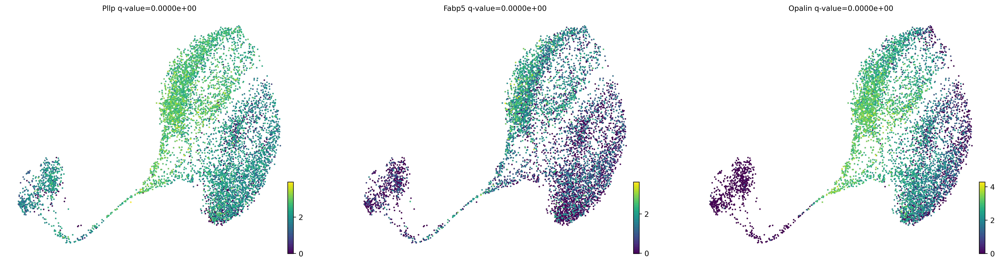

In [18]:
g.plot_lineage_drivers("Oligodendrocytes (Ctrl)", n_genes=3)

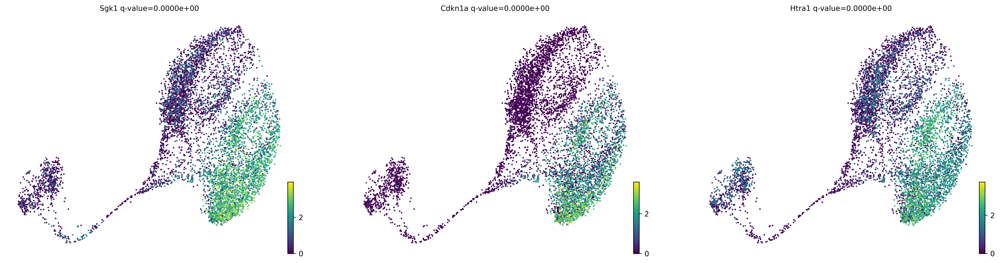

In [19]:
g.plot_lineage_drivers("Oligodendrocytes (Stress)", n_genes=3)

  0%|          | 0/1 [00:00<?, ?gene/s]

TypeError: Fatal model failure `<FailedModel[origin=GAM[gene=None, lineage=None, model=GammaGAM(callbacks=['deviance', 'diffs'], fit_intercept=True, max_iter=2000, scale=None, terms=s(0), tol=0.0001, verbose=False)]]>`.

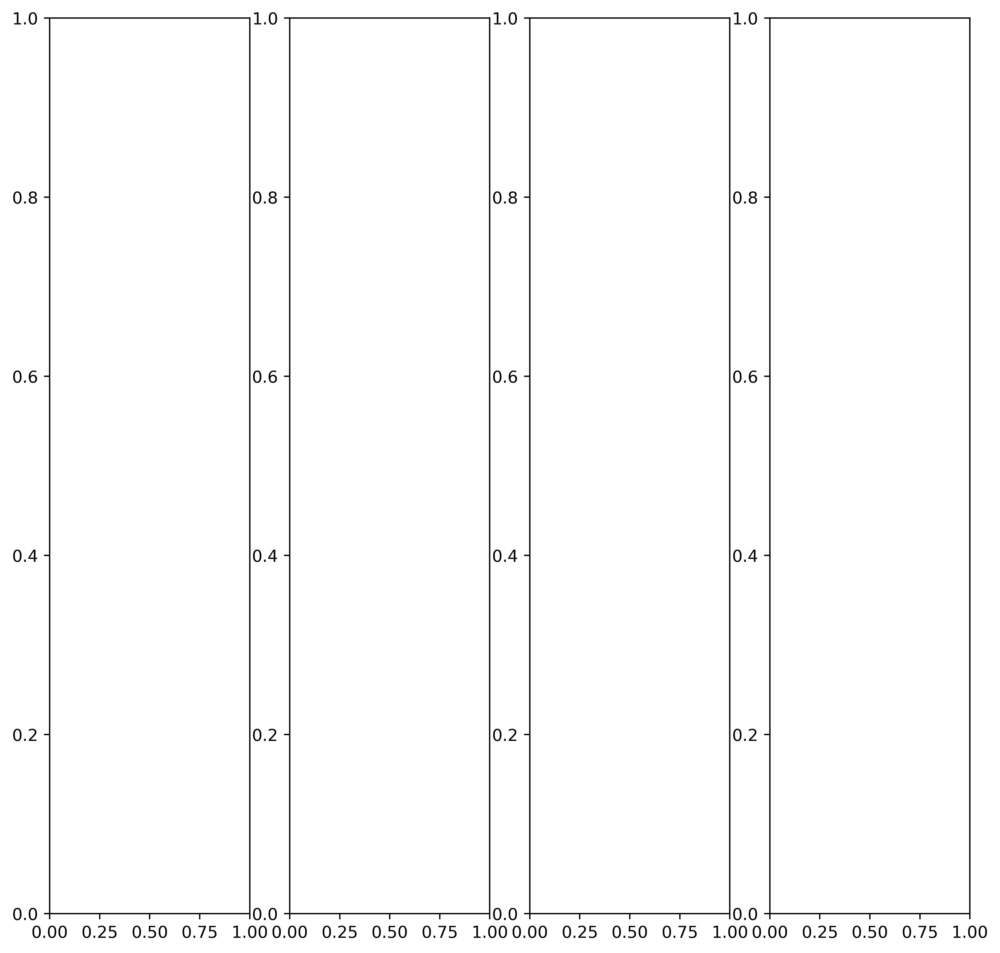

In [23]:
model = cr.ul.models.GAM(adata_oligo_wt)
adata_oligo_wt.X[adata_oligo_wt.X < 0] = 0

fig, ax = plt.subplots(1, 4, figsize=(10, 10))
genes = ['Sgk1','Cdkn1a', 'Fabp5', 'Opalin']
for i, gene in enumerate(genes):
    fig = cr.pl.gene_trends(
        adata_oligo_wt, 
        model=model, 
        data_key='X',
        genes=gene,
        time_key='dpt_pseudotime', 
        same_plot=True, 
        hide_cells=True,
        figsize=(4, 3),
        ax=ax[i], 
    )